# Dogs and People Detection (Thermal images) with YOLOv5 - Inference

* Run YOLOv5 inference on test images







#Install Dependencies

_(**Remember to choose GPU in Runtime if not already selected**. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5


# Then, we can take a look at our training environment provided to us for free from Google Colab.
import torch
from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

# Download Correctly Formatted Dataset 

We'll download our dataset from Roboflow. Use the "**YOLOv5 PyTorch**" export format. Note that the Ultralytics implementation calls for a YAML file defining where your training and test data is. The Roboflow export also writes this format for us.

To get your data into Roboflow, follow the [Getting Started Guide](https://blog.roboflow.ai/getting-started-with-roboflow/).

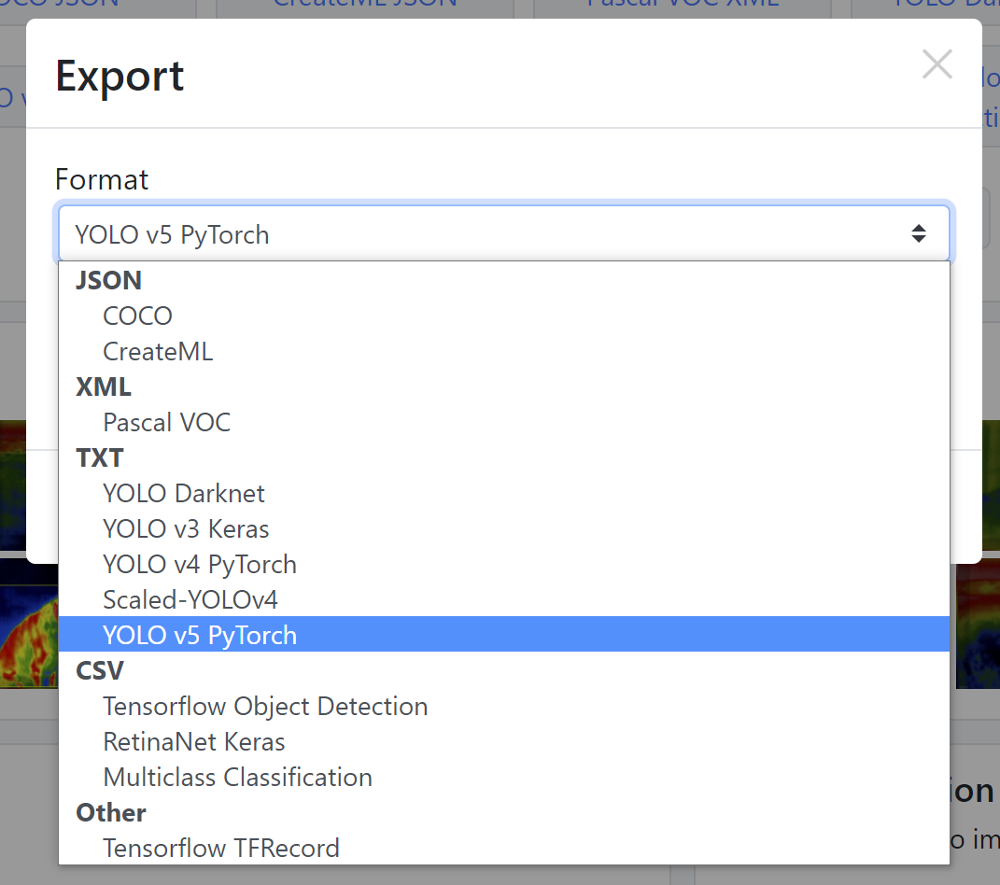



**Quick Note on Labeling Tools**

If you have unlabeled images, you will first need to label them. For free open source labeling tools, you can try [Roboflow Annotate](https://docs.roboflow.com/annotate) or the following guides on [getting started with LabelImg](https://blog.roboflow.com/getting-started-with-labelimg-for-labeling-object-detection-data/) or [getting started with CVAT](https://blog.roboflow.com/getting-started-with-cvat/) annotation tools. Try labeling ~50 images to get a feel of labeling. To improve your model's performance later, you will want to label more.



In [ ]:
# Export code snippet and paste here
%cd /content
!curl -L "" > roboflow.zip; unzip -o roboflow.zip; rm roboflow.zip

The export creates a YOLOv5 .yaml file called `data.yaml` specifying the location of a YOLOv5 `images` folder, a YOLOv5 `labels` folder, and information on our custom classes.

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

Now we take our trained model and make inference on test images. After training has completed model weights will save in `weights/`. For inference we invoke those weights along with a `conf` specifying model confidence (higher confidence required makes less predictions), and a inference `source`. `source` can accept a directory of images, individual images, video files, and also a device's webcam port. For source, I have moved our test/*jpg to `test/images/`.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

DataFolder = "/content/drive/MyDrive/SDAAI/Data"
FruitFolder = DataFolder + "/FruitFolder"

In [ ]:
fruit_pt = FruitFolder + "/model/best.pt"
# copy weights to runs/train/yolov5s_results/weights
%cd /content/yolov5/
!mkdir -p runs/train/yolov5s_results/weights
!cp $fruit_pt runs/train/yolov5s_results/weights

In [ ]:
%ls -ls runs/train/yolov5s_results/weights

In [ ]:
# use the best weights!
%cd /content/yolov5/
!python detect.py --weights  runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images

Finally, we visualize our inference on ALL test images.  This will look much better with longer training above

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

Results: 
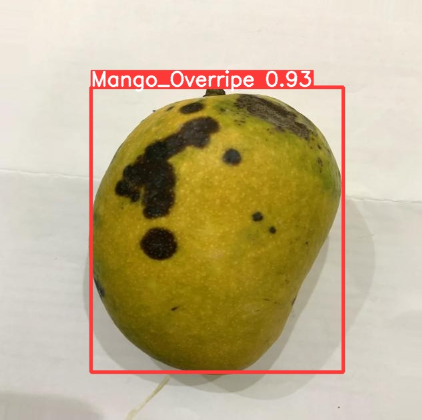
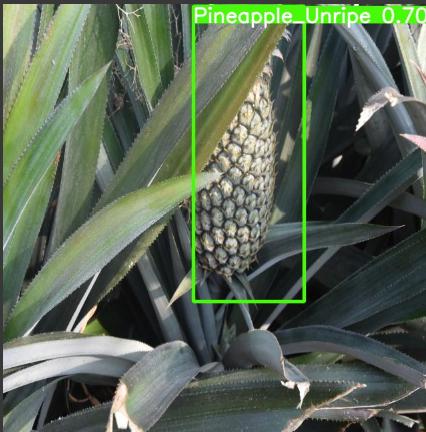
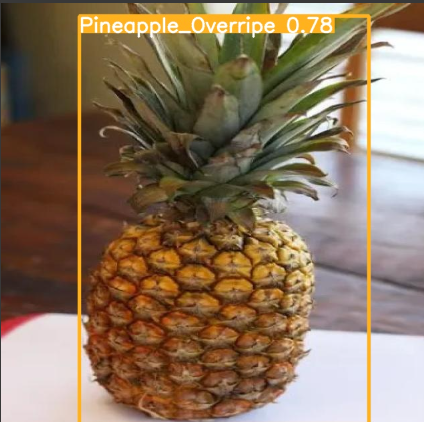
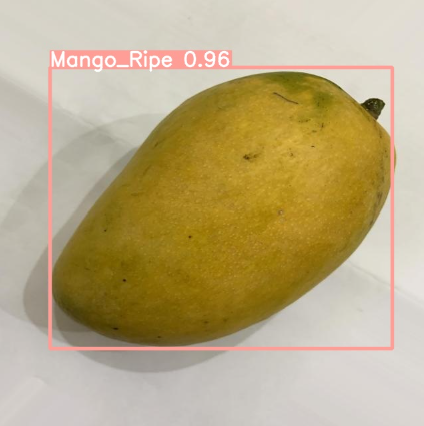
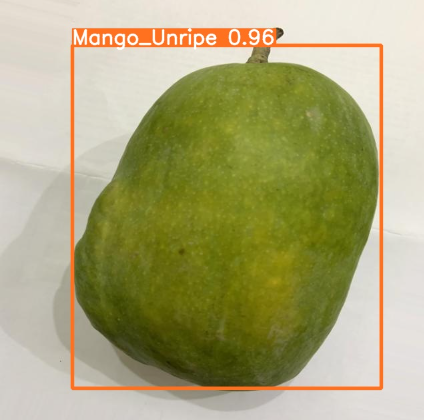
...
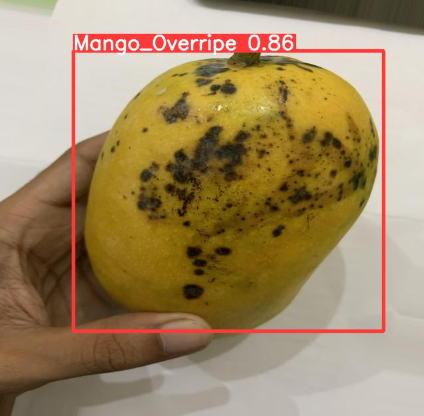
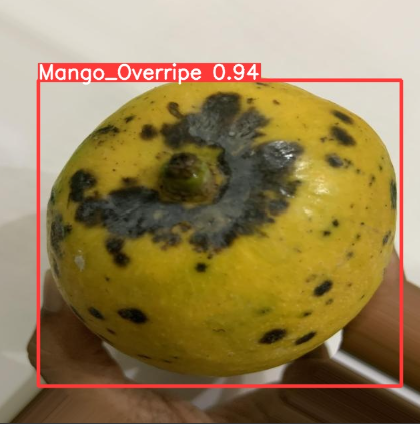
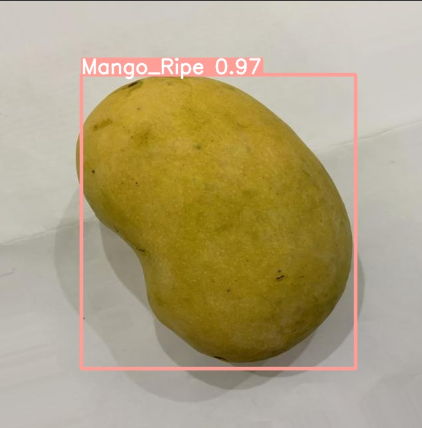
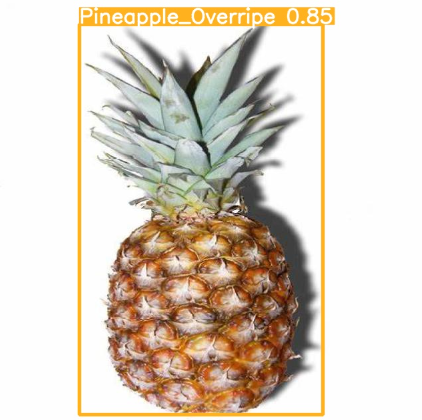
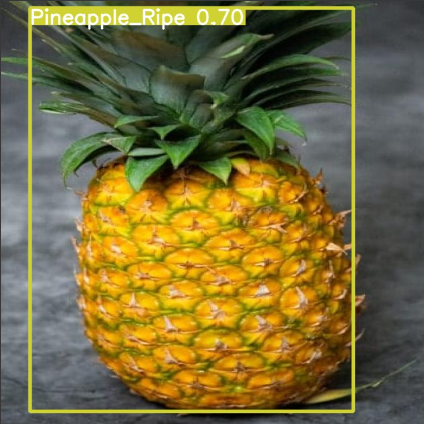

#Run inferrence with trained weights using tourch API

In [ ]:
model = torch.hub.load('.', 'custom', path="runs/train/yolov5s_results/weights/best.pt", source='local') 

In [ ]:
image_path = "" # or file, Path, PIL, OpenCV, numpy, list
image = cv2.imread(image_path)
image_resized = cv2.resize(image, (416, 416))
image_rgb = cv2.cvtColor(image_resized, cv2.COLOR_BGR2RGB)
# Inference
results = model(image_rgb)

# Show results
results.show()

Single Pineapple:

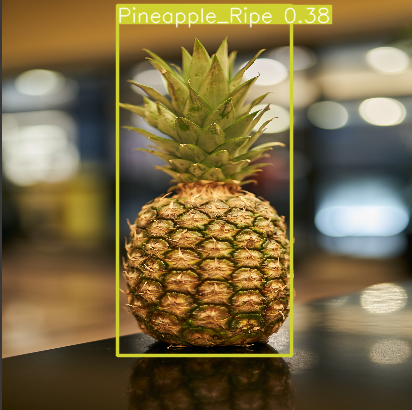
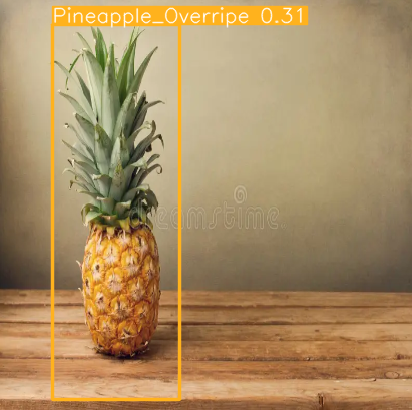

Single Mango: 

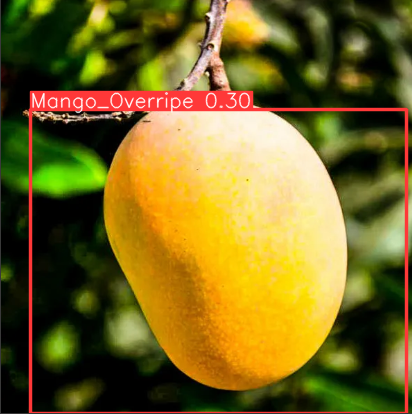
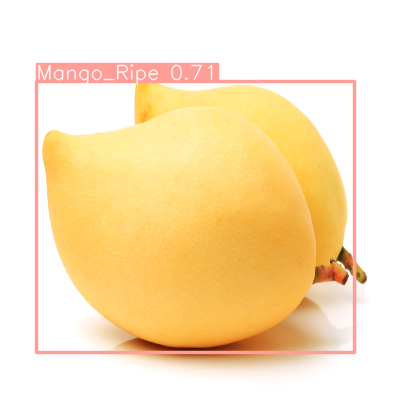

Multiple Pineapples:

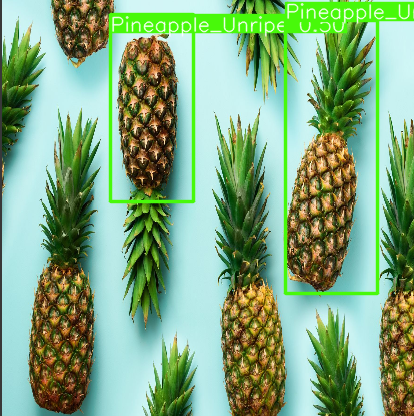

Multiple Mango:

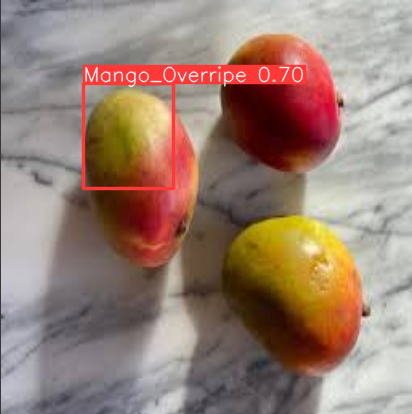


Mix: 

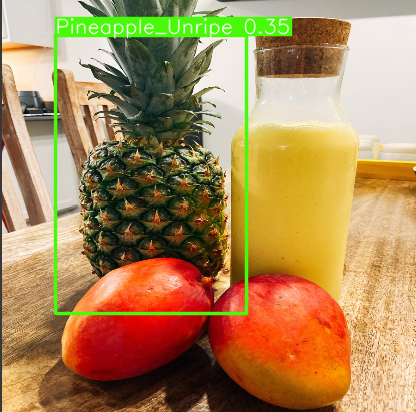

